In [1]:
%matplotlib inline
import copy
import numpy as np
import matplotlib.pyplot as plt

In [2]:
from p2ch12.dsets import getNoduleInfoList, getCt
from util.util import xyz2irc

noduleInfo_list = getNoduleInfoList(requireDataOnDisk_bool=False)
noduleInfo_list[0]

NoduleInfoTuple(isMalignant_bool=True, diameter_mm=32.27003025, series_uid='1.3.6.1.4.1.14519.5.2.1.6279.6001.287966244644280690737019247886', center_xyz=(67.61451718, 85.02525992, -109.8084416))

In [3]:
series_list = sorted(set(t.series_uid for t in noduleInfo_list))

In [4]:
def transparent_cmap(cmap, N=255):
    "Copy colormap and set alpha values"

    mycmap = copy.deepcopy(cmap)
    mycmap._init()
    mycmap._lut[:,-1] = np.linspace(0, 0.75, N+4)
    return mycmap
tgray = transparent_cmap(plt.cm.gray)
tpurp = transparent_cmap(plt.cm.Purples)
tblue = transparent_cmap(plt.cm.Blues)
tgreen = transparent_cmap(plt.cm.Greens)
torange = transparent_cmap(plt.cm.Oranges)
tred = transparent_cmap(plt.cm.Reds)


clim=(0, 1.3)
start_ndx = 3


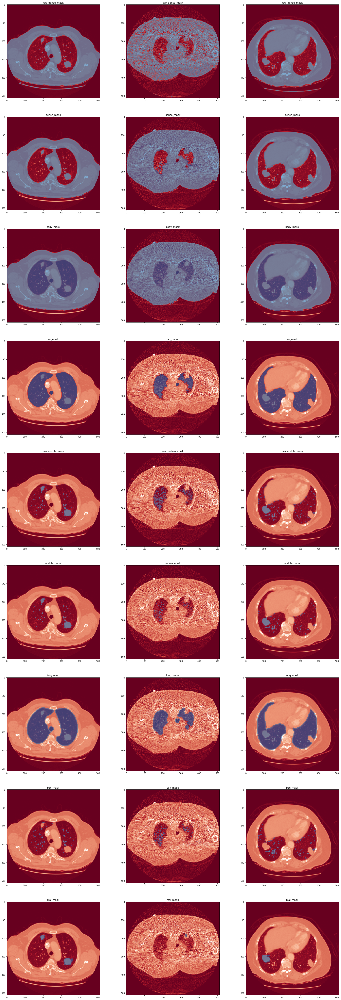

In [5]:
ct_list = []
for nit_ndx in range(start_ndx, start_ndx+3):
    noduleInfo_tup = noduleInfo_list[nit_ndx]
    ct = getCt(noduleInfo_tup.series_uid)
    center_irc = xyz2irc(noduleInfo_tup.center_xyz, ct.origin_xyz, ct.vxSize_xyz, ct.direction_tup)
    
    ct_list.append((ct, center_irc))
start_ndx = nit_ndx + 1

fig = plt.figure(figsize=(30,90))
subplot_ndx = 0 
for ct_ndx, (ct, center_irc) in enumerate(ct_list):
    mask_tup = ct.build2dLungMask(int(center_irc.index))
    for attr_ndx, attr_str in enumerate(mask_tup._fields):

        subplot_ndx = 1 + ct_ndx + 3 * attr_ndx
        subplot = fig.add_subplot(len(mask_tup), len(ct_list), subplot_ndx)
        subplot.set_title(attr_str)

        #print(layer_func, ct.hu_a.shape, layer_func(ct, mask_tup, int(center_irc.index)).shape, center_irc.index)

        plt.imshow(ct.hu_a[int(center_irc.index)], clim=(-1000, 3000), cmap='RdGy')
        plt.imshow(mask_tup[attr_ndx], clim=clim, cmap=tblue)


In [13]:
nit_ndx = 0
noduleInfo_tup = noduleInfo_list[nit_ndx]
ct = getCt(noduleInfo_tup.series_uid)
center_irc = xyz2irc(noduleInfo_tup.center_xyz, ct.origin_xyz, ct.vxSize_xyz, ct.direction_tup)
print(noduleInfo_tup, 'center_irc', center_irc)

mask_tup = ct.build2dLungMask(int(center_irc.index))




NoduleInfoTuple(isMalignant_bool=True, diameter_mm=32.27003025, series_uid='1.3.6.1.4.1.14519.5.2.1.6279.6001.287966244644280690737019247886', center_xyz=(67.61451718, 85.02525992, -109.8084416)) center_irc IrcTuple(index=91.27662336, row=359.6500497243522, col=341.1074155674705)


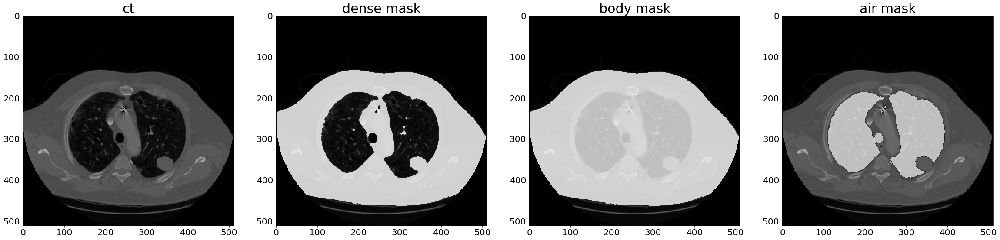

In [7]:
fig = plt.figure(figsize=(40,10))

#subplot = fig.add_subplot(1, 4, 1)
#subplot.set_title('ct', fontsize=30)
#plt.imshow(ct.hu_a[int(center_irc.index)], clim=(-1000, 1000), cmap='gray')

subplot = fig.add_subplot(1, 4, 1)
subplot.set_title('ct', fontsize=30)
for label in (subplot.get_xticklabels() + subplot.get_yticklabels()):
    label.set_fontsize(20)
plt.imshow(ct.hu_a[int(center_irc.index)], clim=(-1000, 2000), cmap='gray')

#subplot = fig.add_subplot(1, 4, 3)
#subplot.set_title('ct annotation example', fontsize=30)
#plt.imshow(ct.hu_a[int(center_irc.index)], clim=(-1000, 3000), cmap='gray')

#subplot = fig.add_subplot(1, 4, 2)
#subplot.set_title('raw_dense mask', fontsize=30)
#plt.imshow(ct.hu_a[int(center_irc.index)], clim=(-1000, 2000), cmap='gray')
#plt.imshow(mask_tup.dense_mask, clim=(0,1), cmap=tgray)

subplot = fig.add_subplot(1, 4, 2)
subplot.set_title('dense mask', fontsize=30)
for label in (subplot.get_xticklabels() + subplot.get_yticklabels()):
    label.set_fontsize(20)
plt.imshow(ct.hu_a[int(center_irc.index)], clim=(-1000, 2000), cmap='gray')
plt.imshow(mask_tup.dense_mask, clim=(0,1), cmap=tgray)


#subplot = fig.add_subplot(1, 3, 2)
#subplot.set_title('denoise mask', fontsize=30)
#plt.imshow(ct.hu_a[int(center_irc.index)], clim=(-1000, 2000), cmap='gray')
#plt.imshow(mask_tup.denoise_mask, clim=(0,0.5), cmap=tgray)

subplot = fig.add_subplot(1, 4, 3)
subplot.set_title('body mask', fontsize=30)
for label in (subplot.get_xticklabels() + subplot.get_yticklabels()):
    label.set_fontsize(20)
plt.imshow(ct.hu_a[int(center_irc.index)], clim=(-1000, 2000), cmap='gray')
plt.imshow(mask_tup.body_mask, clim=(0,1), cmap=tgray)

subplot = fig.add_subplot(1, 4, 4)
subplot.set_title('air mask', fontsize=30)
for label in (subplot.get_xticklabels() + subplot.get_yticklabels()):
    label.set_fontsize(20)
plt.imshow(ct.hu_a[int(center_irc.index)], clim=(-1000, 2000), cmap='gray')
plt.imshow(mask_tup.air_mask, clim=(0,1), cmap=tgray)


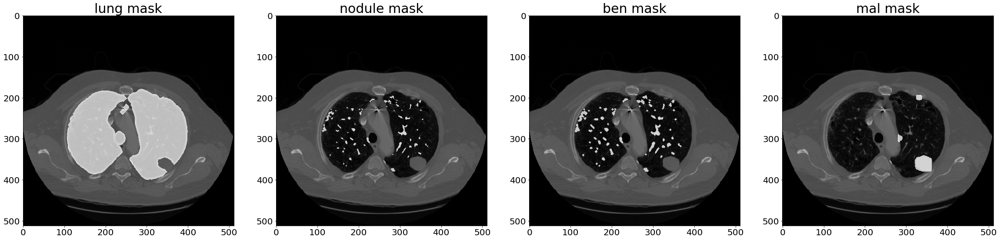

In [8]:
fig = plt.figure(figsize=(40,10))

subplot = fig.add_subplot(1, 4, 1)
subplot.set_title('lung mask', fontsize=30)
for label in (subplot.get_xticklabels() + subplot.get_yticklabels()):
    label.set_fontsize(20)
plt.imshow(ct.hu_a[int(center_irc.index)], clim=(-1000, 2000), cmap='gray')
plt.imshow(mask_tup.lung_mask, clim=(0,1), cmap=tgray)

subplot = fig.add_subplot(1, 4, 2)
subplot.set_title('nodule mask', fontsize=30)
for label in (subplot.get_xticklabels() + subplot.get_yticklabels()):
    label.set_fontsize(20)
plt.imshow(ct.hu_a[int(center_irc.index)], clim=(-1000, 2000), cmap='gray')
plt.imshow(mask_tup.nodule_mask, clim=(0,1), cmap=tgray)

subplot = fig.add_subplot(1, 4, 3)
subplot.set_title('ben mask', fontsize=30)
for label in (subplot.get_xticklabels() + subplot.get_yticklabels()):
    label.set_fontsize(20)
plt.imshow(ct.hu_a[int(center_irc.index)], clim=(-1000, 2000), cmap='gray')
plt.imshow(mask_tup.ben_mask, clim=(0,1), cmap=tgray)

subplot = fig.add_subplot(1, 4, 4)
subplot.set_title('mal mask', fontsize=30)
for label in (subplot.get_xticklabels() + subplot.get_yticklabels()):
    label.set_fontsize(20)
plt.imshow(ct.hu_a[int(center_irc.index)], clim=(-1000, 2000), cmap='gray')
plt.imshow(mask_tup.mal_mask, clim=(0,1), cmap=tgray)



NoduleInfoTuple(isMalignant_bool=True, diameter_mm=30.61040636, series_uid='1.3.6.1.4.1.14519.5.2.1.6279.6001.112740418331256326754121315800', center_xyz=(47.90350511, 37.60442008, -99.93417567)) center_irc IrcTuple(index=113.526329732, row=327.9416653824, col=333.8284788608)


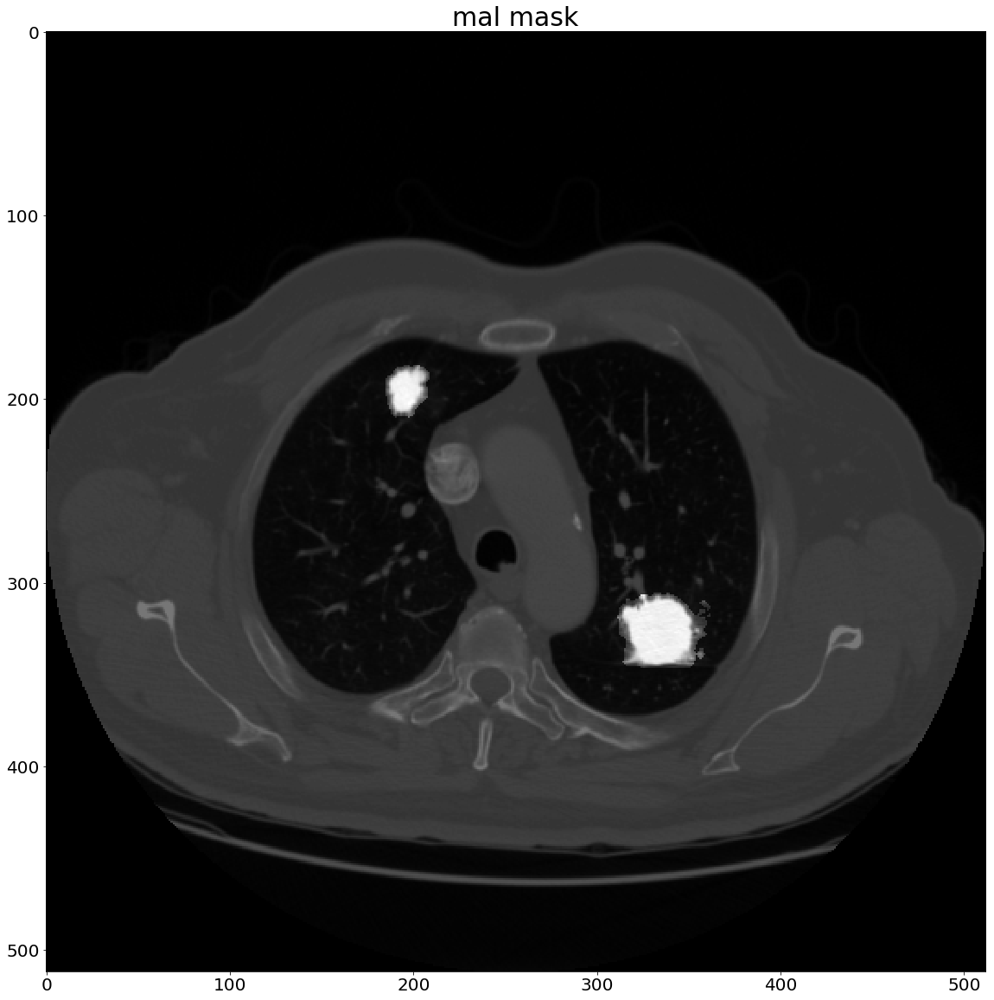

In [26]:
nit_ndx = 1
noduleInfo_tup = noduleInfo_list[nit_ndx]
ct = getCt(noduleInfo_tup.series_uid)
center_irc = xyz2irc(noduleInfo_tup.center_xyz, ct.origin_xyz, ct.vxSize_xyz, ct.direction_tup)
print(noduleInfo_tup, 'center_irc', center_irc)

mask_tup = ct.build2dLungMask(int(center_irc.index))


fig = plt.figure(figsize=(20,20))

slice_a = (ct.hu_a[int(center_irc.index)] + 1000) / 2000

subplot = fig.add_subplot(1, 1, 1)
subplot.set_title('mal mask', fontsize=30)
for label in (subplot.get_xticklabels() + subplot.get_yticklabels()):
    label.set_fontsize(20)
plt.imshow(
    slice_a + 3 * slice_a * mask_tup.mal_mask, 
    #clim=(-2000, 2000), 
    cmap='gray',
)
#plt.imshow(ct.hu_a[int(center_irc.index)] * mask_tup.mal_mask, clim=(-1000,1000), cmap='gray')



In [10]:
from p2ch12.train_cls import LunaTrainingApp

cls_app = LunaTrainingApp(['--augmented', '--balanced'])
train_dl = cls_app.initTrainDl()

_ = train_dl.dataset[0]

2019-07-10 22:47:47,547 INFO     pid:7616 p2ch12.dsets:416:__init__ <p2ch12.dsets.LunaDataset object at 0x000001E5EE0069E8>: 499470 training samples, 498285 ben, 1185 mal, 1:1 ratio


[40, tensor([0, 1]), '1.3.6.1.4.1.14519.5.2.1.6279.6001.176030616406569931557298712518', tensor([ 91.4560, 363.5351, 215.4248])]


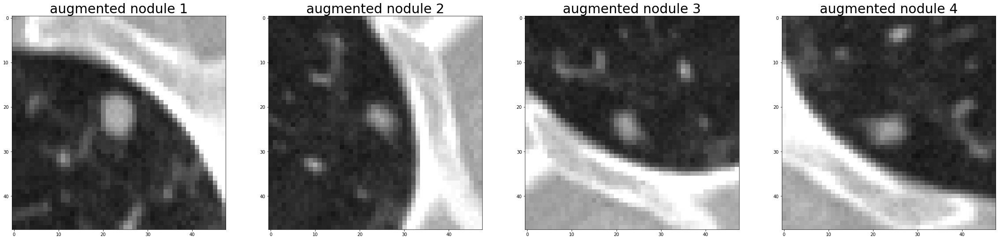

In [11]:
sample_ndx = 40

#while train_dl.dataset[sample_ndx][1][0]:
#    sample_ndx += 1

fig = plt.figure(figsize=(40,10))

nodule_t, malignant_t, series_uid, center_irc = train_dl.dataset[sample_ndx]
subplot = fig.add_subplot(1, 4, 1)
subplot.set_title('augmented nodule 1', fontsize=30)
plt.imshow(nodule_t[0,12], clim=(-1000, 500), cmap='gray')

nodule_t, malignant_t, series_uid, center_irc = train_dl.dataset[sample_ndx]
subplot = fig.add_subplot(1, 4, 2)
subplot.set_title('augmented nodule 2', fontsize=30)
plt.imshow(nodule_t[0,12], clim=(-1000, 500), cmap='gray')

nodule_t, malignant_t, series_uid, center_irc = train_dl.dataset[sample_ndx]
subplot = fig.add_subplot(1, 4, 3)
subplot.set_title('augmented nodule 3', fontsize=30)
plt.imshow(nodule_t[0,12], clim=(-1000, 500), cmap='gray')

nodule_t, malignant_t, series_uid, center_irc = train_dl.dataset[sample_ndx]
subplot = fig.add_subplot(1, 4, 4)
subplot.set_title('augmented nodule 4', fontsize=30)
plt.imshow(nodule_t[0,12], clim=(-1000, 500), cmap='gray')


print([sample_ndx, malignant_t, series_uid, center_irc])
